<a href="https://colab.research.google.com/github/EndarMuh/PCVK_Ganjil_2023/blob/main/Quiz_PCVK_Kelompok_4.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!pip install pytesseract
!sudo apt-get install tesseract-ocr-ind

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
tesseract-ocr-ind is already the newest version (1:4.00~git30-7274cfa-1.1).
0 upgraded, 0 newly installed, 0 to remove and 11 not upgraded.


In [ ]:
import cv2
import numpy as np
import os
import pytesseract
from matplotlib import pyplot as plt
from pytesseract import Output
from PIL import Image

In [ ]:
def pra_pemrosesan_gambar(gambar):
    #Konversi gambar warna input ke citra grayscale
    citra_abu = cv2.cvtColor(gambar, cv2.COLOR_BGR2GRAY)

    #Tentukan kernel untuk operasi morfologi
    kernel = np.ones((5, 5), np.uint8)

    #Terapkan operasi morfologi pembukaan untuk mengurangi noise dan memisahkan objek
    citra_terbuka = cv2.morphologyEx(citra_abu, cv2.MORPH_OPEN, kernel)

    #Terapkan erosi untuk lebih mengurangi ukuran objek foreground
    citra_tererosi = cv2.erode(citra_terbuka, kernel, iterations=1)

    #Kembalikan gambar yang telah diproses
    return citra_tererosi


Processing images in folder: Iphone8


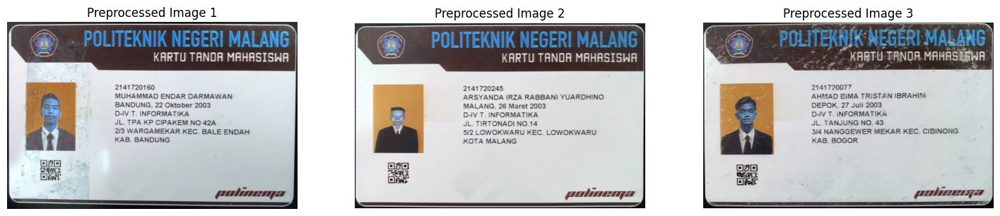


Processing images in folder: Xiaomi10Pro


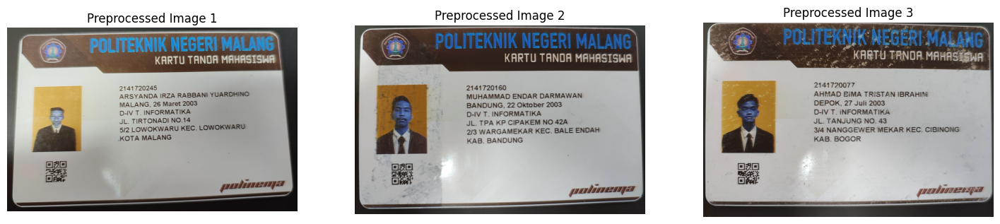


Processing images in folder: Iphone11Pro


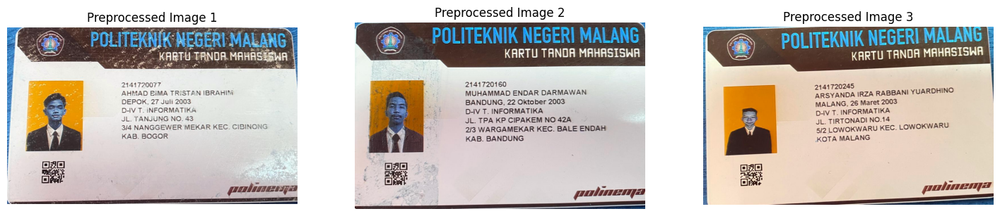

In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Define the preprocess_image function here (copy it from your previous code)

main_folder_path = '/content/drive/MyDrive/PCVK_2023/QUIZ2/dataset/'

for folder_name in os.listdir(main_folder_path):
    folder_path = os.path.join(main_folder_path, folder_name)

    if os.path.isdir(folder_path):
        print(f"\nProcessing images in folder: {folder_name}")

        plt.figure(figsize=(18, 6))

        for idx, filename in enumerate(os.listdir(folder_path)):
            file_path = os.path.join(folder_path, filename)

            original_image = cv2.imread(file_path)

            preprocessed_img = original_image

            plt.subplot(1, 3, idx + 1)
            plt.imshow(preprocessed_img, cmap='gray')
            plt.title(f'Preprocessed Image {idx + 1}')
            plt.axis('off')

        plt.show()


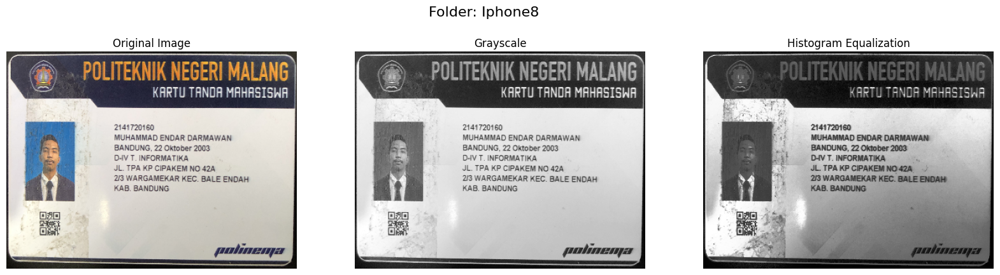

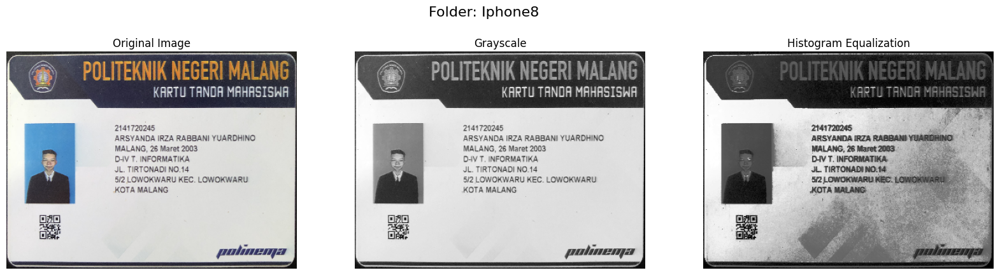

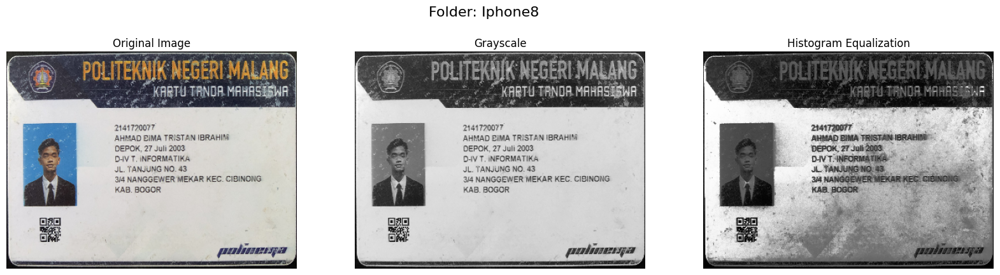

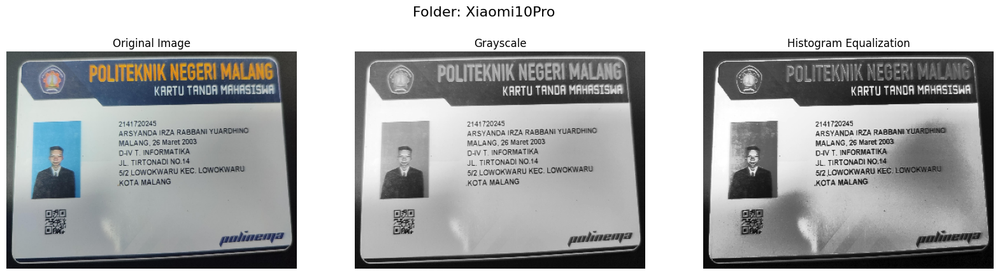

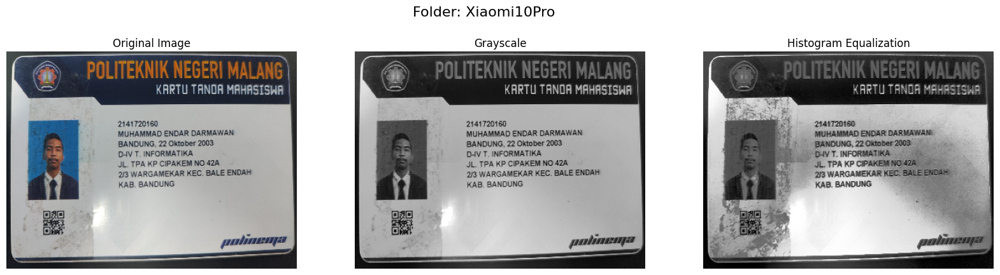

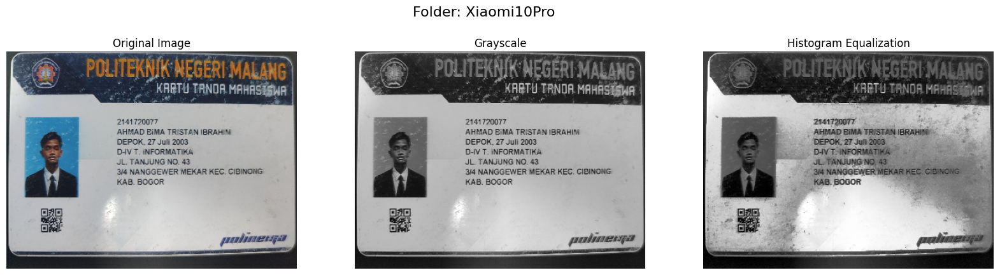

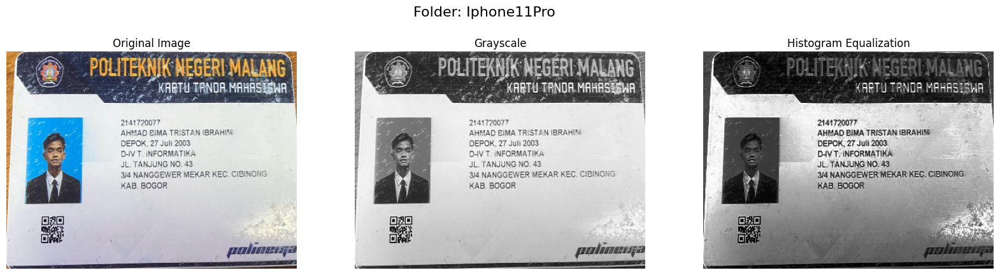

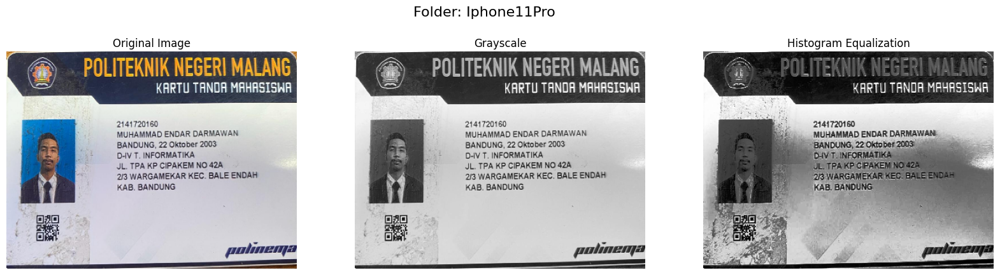

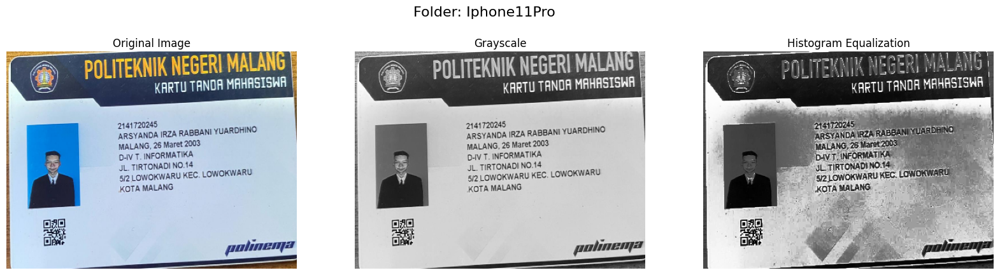

In [ ]:
import os
import cv2
import matplotlib.pyplot as plt

# Direktori citra KTM
main_folder = '/content/drive/MyDrive/PCVK_2023/QUIZ2/dataset/'

# Ambil daftar file dalam direktori
files = os.listdir(main_folder)

# Loop melalui semua gambar dalam direktori
for folder_name in os.listdir(main_folder):
    folder_path = os.path.join(main_folder, folder_name)

    # Loop melalui semua file dalam direktori
    for filename in os.listdir(folder_path):
        file_path = os.path.join(folder_path, filename)

        # Load the image
        img = cv2.imread(file_path)

        # PREPROCESSING
        # (1) Resize the image
        img = cv2.resize(img, (400, 300))

        # (2) Convert to Grayscale
        gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

        # (3) Histogram Equalization
        equalized_img = cv2.equalizeHist(gray_img)

        # Create a larger figure for displaying images
        plt.figure(figsize=(20, 6))

        # Add title with folder name above the set of images
        plt.suptitle(f'Folder: {folder_name}', fontsize=16, y=0.9)

        # Gambar asli
        plt.subplot(131)
        plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        plt.title('Original Image')
        plt.axis('off')

        # Grayscale image (PREPROCESSING)
        plt.subplot(132)
        plt.imshow(gray_img, cmap='gray')
        plt.title('Grayscale')
        plt.axis('off')

        # Equalized Image (PREPROCESSING)
        plt.subplot(133)
        plt.imshow(equalized_img, cmap='gray')
        plt.title('Histogram Equalization')
        plt.axis('off')

        plt.show()


In [86]:
def detect_text(img):
    image_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    return pytesseract.image_to_string(image_rgb,  lang="ind")

def detect_and_draw_boxes(image, confidence_threshold=60):
  image_with_boxes = image.copy()

  d = pytesseract.image_to_data(image, output_type=Output.DICT)
  n_boxes = len(d['text'])

  for i in range(n_boxes):
    if int(d['conf'][i]) > confidence_threshold:
       (x, y, w, h) = (d['left'][i], d['top'][i], d['width'][i], d['height'][i])

       image_with_boxes = cv2.rectangle(image_with_boxes, (x, y), (x + w, y + h), (0, 255, 0), 2)

  b, g, r = cv2.split(image_with_boxes)
  return cv2.merge([r, g, b])


Detected images in folder: Iphone8


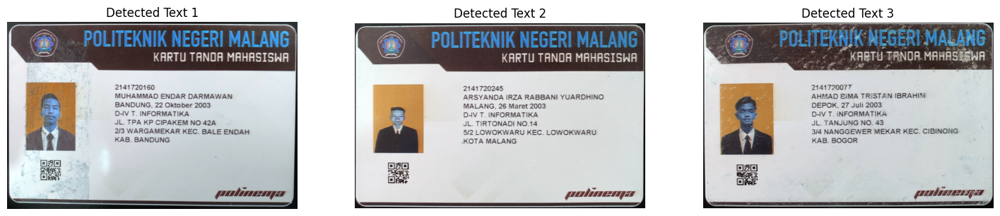


Detected images in folder: Xiaomi10Pro


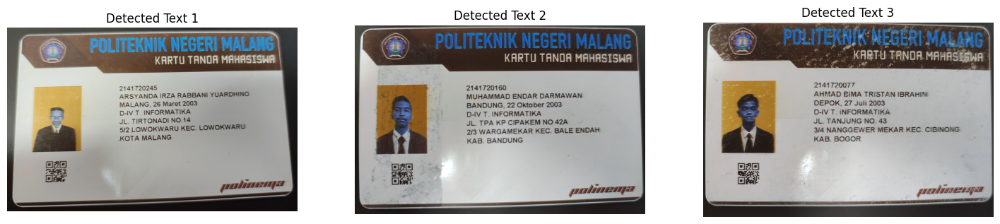


Detected images in folder: Iphone11Pro


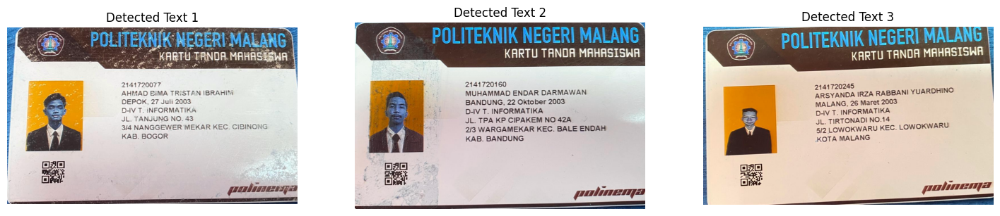

In [87]:
for folder_name in os.listdir(main_folder_path):
    folder_path = os.path.join(main_folder_path, folder_name)

    if os.path.isdir(folder_path):
        print(f"\nDetected images in folder: {folder_name}")

        plt.figure(figsize=(18, 6))

        for idx, filename in enumerate(os.listdir(folder_path)):
            file_path = os.path.join(folder_path, filename)
            original_image = cv2.imread(file_path)

            result_image = original_image

            plt.subplot(1, 3, idx + 1)
            plt.imshow(result_image)
            plt.title(f'Detected Text {idx + 1}')
            plt.axis('off')

        plt.show()


Detected text in folder: Iphone8


/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 12 () missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


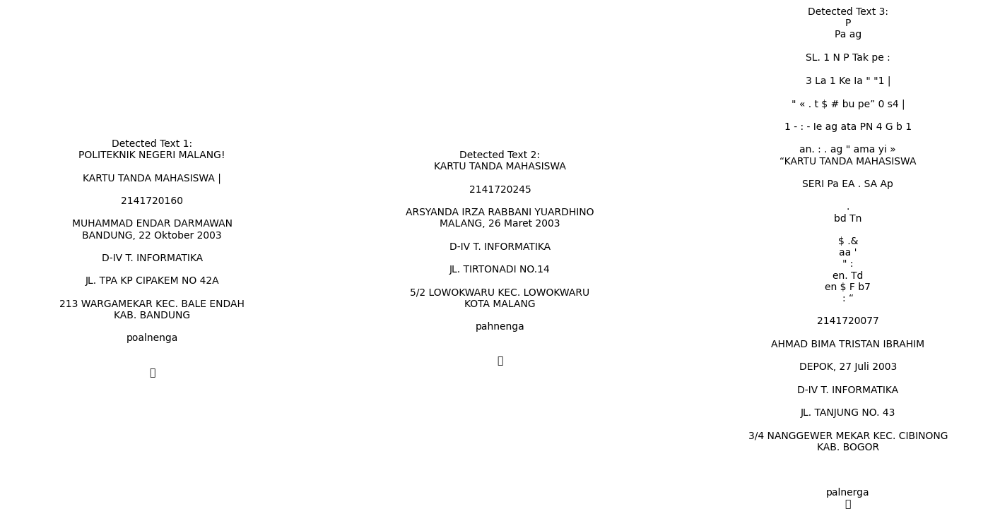


Detected text in folder: Xiaomi10Pro


/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 12 () missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


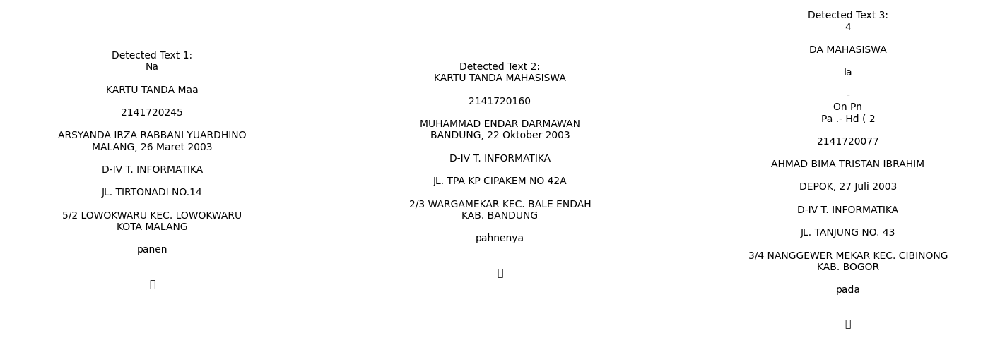


Detected text in folder: Iphone11Pro


/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 12 () missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


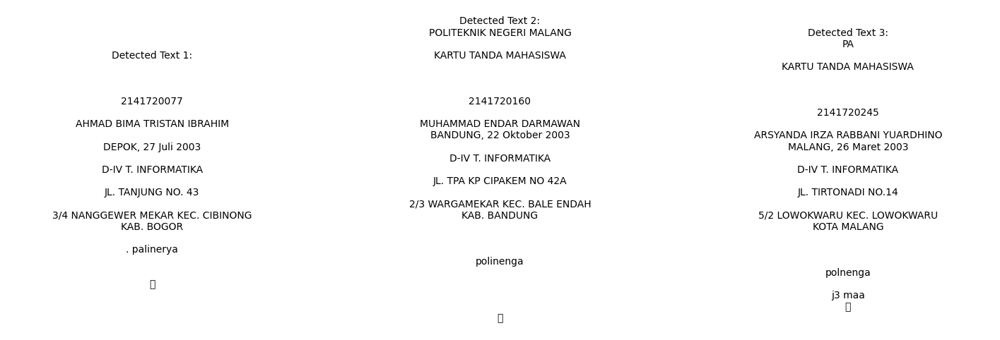

In [88]:
for folder_name in os.listdir(main_folder_path):
    folder_path = os.path.join(main_folder_path, folder_name)

    if os.path.isdir(folder_path):
        print(f"\nDetected text in folder: {folder_name}")

        plt.figure(figsize=(18, 6))

        images_in_folder = os.listdir(folder_path)[:3]

        for idx, filename in enumerate(images_in_folder):
            file_path = os.path.join(folder_path, filename)
            original_image = cv2.imread(file_path)

            detected_text = detect_text(original_image)

            plt.subplot(1, 3, idx + 1)
            plt.text(
                0.5, 0.5, f'Detected Text {idx + 1}:\n{detected_text}',
                color='black', backgroundcolor='white',
                transform=plt.gca().transAxes,
                verticalalignment='center', horizontalalignment='center'
            )
            plt.axis('off')

        plt.show()